In [1]:
# Install required packages for Google Colab
# Run this cell first and restart runtime when prompted

!pip install deepface transformers torch torchvision opencv-python matplotlib pillow numpy

# After installation, restart runtime: Runtime > Restart runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 67.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 57.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 34.7 MB/s eta 0:00:00
  

In [2]:
# ============================================================================
# EMOTION-GUIDED VLM DEMO - VERSION 2 (CLEAN DEMO VERSION)
# ============================================================================
#
# This is a streamlined version containing only the essential code for:
# 1. Interactive emotion analysis from uploaded images
# 2. Live webcam emotion detection and analysis
#
# All diagnostic, testing, and alternative demo functions have been removed
# for a clean, focused demo experience.
# ============================================================================

# ============================================================================
# CELL 1: IMPORTS & CONFIGURATION (Code Cell)
# ============================================================================

"""
## 📦 Essential Imports & Configuration

Core dependencies and configuration for emotion detection and VLM analysis.
"""

# Standard library imports
import os
import warnings
warnings.filterwarnings('ignore')

# Computer vision and image processing
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from collections import defaultdict

# Deep learning frameworks
try:
    import torch
    import torch.nn.functional as F
    from transformers import BlipProcessor, BlipForConditionalGeneration
    print("✅ PyTorch and Transformers loaded successfully")
except ImportError as e:
    print(f"❌ Error loading PyTorch/Transformers: {e}")

# DeepFace for emotion analysis
try:
    from deepface import DeepFace
    print("✅ DeepFace loaded successfully")
except ImportError as e:
    print(f"❌ Error loading DeepFace: {e}")

# Environment detection
try:
    from google.colab import files, output
    from IPython.display import Javascript, display, HTML
    COLAB_AVAILABLE = True
    print("✅ Google Colab environment detected")
except ImportError:
    COLAB_AVAILABLE = False
    print("ℹ️ Local environment detected")

print("🚀 All essential imports loaded successfully!")

# ============================================================================
# GLOBAL CONFIGURATION
# ============================================================================

CONFIG = {
    # Face detection parameters
    'scale_factor': 1.05,
    'min_neighbors': 8,
    'min_face_size': (40, 40),
    'max_face_size': (300, 300),

    # Emotion analysis parameters
    'emotion_confidence_threshold': 30.0,
    'aggregation_method': 'weighted_average',  # 'majority', 'weighted_average', 'dominant'
    'distance_weight': True,

    # VLM parameters
    'max_vlm_length': 50,
    'device': 'cuda' if torch.cuda.is_available() else 'cpu'
}

print(f"⚙️ Configuration loaded - Device: {CONFIG['device']}")
print("✅ Cell 1 Complete: Imports & Configuration Ready!")

✅ PyTorch and Transformers loaded successfully
25-06-04 21:55:20 - Directory /root/.deepface has been created
25-06-04 21:55:20 - Directory /root/.deepface/weights has been created
✅ DeepFace loaded successfully
✅ Google Colab environment detected
🚀 All essential imports loaded successfully!
⚙️ Configuration loaded - Device: cpu
✅ Cell 1 Complete: Imports & Configuration Ready!


In [3]:
# ============================================================================
# CELL 2: MULTI-PERSON EMOTION ANALYZER (Code Cell)
# ============================================================================

"""
## 🎭 Multi-Person Emotion Analyzer

Advanced emotion detection system with:
- OpenCV Haar Cascade face detection with validation
- DeepFace emotion analysis
- Multiple aggregation methods for group emotions
- Coordinate validation and visualization
"""

class MultiPersonEmotionAnalyzer:
    """
    Advanced multi-person emotion detection and analysis system.
    """

    def __init__(self, config=CONFIG):
        self.config = config
        self.face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

        # Detection parameters
        self.detection_params = {
            'scaleFactor': config['scale_factor'],
            'minNeighbors': config['min_neighbors'],
            'minSize': config['min_face_size'],
            'maxSize': config['max_face_size']
        }

        print("🎭 Multi-Person Emotion Analyzer initialized!")

    def validate_face_detection(self, image_gray, x, y, w, h):
        """Enhanced validation to filter false positives"""
        try:
            # Extract face region
            face_region = image_gray[y:y+h, x:x+w]

            if face_region.size == 0:
                return False

            # Calculate contrast (standard deviation)
            contrast = np.std(face_region)

            # Calculate average intensity
            avg_intensity = np.mean(face_region)

            # Calculate aspect ratio
            aspect_ratio = w / h

            print(f"🔍 Validating face candidate at ({x},{y}) size {w}×{h}")
            print(f"   ✅ Passed validation: contrast={contrast:.1f}, intensity={avg_intensity:.1f}, ratio={aspect_ratio:.2f}")

            # Validation criteria
            if contrast < 20:  # Too uniform (likely background)
                return False
            if avg_intensity < 10 or avg_intensity > 250:  # Too dark or too bright
                return False
            if aspect_ratio < 0.7 or aspect_ratio > 1.5:  # Not face-like proportions
                return False

            return True

        except Exception as e:
            print(f"   ❌ Validation error: {e}")
            return False

    def detect_faces(self, image):
        """Detect faces and return coordinates only"""
        if isinstance(image, str):
            image_bgr = cv2.imread(image)
            if image_bgr is None:
                raise ValueError(f"Could not load image from {image}")
        else:
            image_bgr = image.copy()

        gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
        gray_enhanced = cv2.equalizeHist(gray)

        # Detect faces
        faces = self.face_cascade.detectMultiScale(gray_enhanced, **self.detection_params)

        # Apply validation
        validated_faces = []
        for x, y, w, h in faces:
            if self.validate_face_detection(gray_enhanced, x, y, w, h):
                validated_faces.append((x, y, w, h))

        return np.array(validated_faces) if validated_faces else np.array([])

    def detect_faces_and_emotions(self, image_path):
        """Complete face detection and emotion analysis pipeline"""
        if isinstance(image_path, str):
            image_bgr = cv2.imread(image_path)
            if image_bgr is None:
                raise ValueError(f"Could not load image from {image_path}")
        else:
            image_bgr = image_path.copy()

        print(f"🖼️ Original image shape: {image_bgr.shape}")

        # Convert BGR to RGB for consistent processing
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

        # Create grayscale for face detection
        gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
        gray_enhanced = cv2.equalizeHist(gray)

        print(f"✨ Applied histogram equalization for better detection")

        # Detect faces with validation
        faces = self.face_cascade.detectMultiScale(gray_enhanced, **self.detection_params)
        print(f"👥 Found {len(faces)} potential face candidates")

        # Apply validation
        validated_faces = []
        for i, (x, y, w, h) in enumerate(faces):
            if self.validate_face_detection(gray_enhanced, x, y, w, h):
                validated_faces.append((x, y, w, h))
                print(f"   ✅ Candidate {i+1} validated as likely face")
            else:
                print(f"   ❌ Candidate {i+1} rejected as likely false positive")

        faces = np.array(validated_faces) if validated_faces else np.array([])
        print(f"✅ After validation: {len(faces)} confirmed faces")

        # Process each validated face
        results = []
        img_height, img_width = image_rgb.shape[:2]

        for i, (x, y, w, h) in enumerate(faces):
            # Store coordinates as integers
            bbox = (int(x), int(y), int(w), int(h))

            print(f"\n🔍 Processing validated face {i+1}:")
            print(f"  Stored bbox: {bbox}")

            # Validate coordinates are within bounds
            if x < 0 or y < 0 or x + w > img_width or y + h > img_height:
                print(f"    ⚠️ Face {i+1} coordinates out of bounds, skipping")
                continue

            # Extract face region
            try:
                face_roi = image_rgb[y:y+h, x:x+w].copy()
                if face_roi.size == 0:
                    continue

                print(f"    ✅ Face ROI extracted: shape={face_roi.shape}")

                # Analyze emotion
                emotion_result = DeepFace.analyze(
                    face_roi,
                    actions=['emotion'],
                    enforce_detection=False,
                    silent=True
                )

                if isinstance(emotion_result, list):
                    emotion_result = emotion_result[0]

                dominant_emotion = emotion_result['dominant_emotion']
                emotion_scores = emotion_result['emotion']
                confidence = emotion_scores[dominant_emotion]

                print(f"    🎭 Emotion: {dominant_emotion} ({confidence:.1f}%)")

                # Only include if confidence is above threshold
                if confidence >= self.config['emotion_confidence_threshold']:
                    face_result = {
                        'person_id': i + 1,
                        'bbox': bbox,
                        'face_area': w * h,
                        'dominant_emotion': dominant_emotion,
                        'confidence': confidence,
                        'emotion_scores': emotion_scores
                    }

                    results.append(face_result)
                    print(f"    ✅ Face {i+1} accepted (confidence above threshold)")
                else:
                    print(f"    ❌ Face {i+1} rejected (confidence too low)")

            except Exception as e:
                print(f"    ❌ Error analyzing face {i+1}: {e}")
                continue

        print(f"\n✅ Final results: {len(results)} faces with valid emotions")
        return results, image_rgb

    def aggregate_emotions(self, emotion_results):
        """Aggregate emotions from multiple people"""
        if not emotion_results:
            return {'group_emotion': 'neutral', 'confidence': 0.0, 'method': 'no_faces'}

        method = self.config['aggregation_method']

        if method == 'majority':
            return self._majority_aggregation(emotion_results)
        elif method == 'weighted_average':
            return self._weighted_average_aggregation(emotion_results)
        elif method == 'dominant':
            return self._dominant_aggregation(emotion_results)

    def _majority_aggregation(self, emotion_results):
        """Simple majority vote"""
        emotion_counts = defaultdict(int)

        for result in emotion_results:
            emotion_counts[result['dominant_emotion']] += 1

        dominant_emotion = max(emotion_counts.items(), key=lambda x: x[1])

        return {
            'group_emotion': dominant_emotion[0],
            'confidence': dominant_emotion[1] / len(emotion_results),
            'method': 'majority',
            'vote_counts': dict(emotion_counts)
        }

    def _weighted_average_aggregation(self, emotion_results):
        """Weighted average based on confidence"""
        emotion_weights = defaultdict(float)
        total_weight = 0

        for result in emotion_results:
            weight = result['confidence']

            # Add distance weighting (larger faces = closer = more weight)
            if self.config['distance_weight']:
                face_area = result['face_area']
                max_area = max([r['face_area'] for r in emotion_results])
                distance_weight = face_area / max_area
                weight *= distance_weight

            emotion_weights[result['dominant_emotion']] += weight
            total_weight += weight

        # Normalize weights
        if total_weight > 0:
            emotion_weights = {k: v/total_weight for k, v in emotion_weights.items()}

        # Get dominant weighted emotion
        dominant_emotion = max(emotion_weights.items(), key=lambda x: x[1])

        return {
            'group_emotion': dominant_emotion[0],
            'confidence': dominant_emotion[1],
            'method': 'weighted_average',
            'emotion_weights': dict(emotion_weights)
        }

    def _dominant_aggregation(self, emotion_results):
        """Select emotion from person with highest confidence"""
        max_confidence_result = max(emotion_results, key=lambda x: x['confidence'])

        return {
            'group_emotion': max_confidence_result['dominant_emotion'],
            'confidence': max_confidence_result['confidence'],
            'method': 'dominant',
            'dominant_person': max_confidence_result['person_id']
        }

    def visualize_results(self, image, emotion_results, group_result):
        """Create visualization with face bounding boxes and emotion labels"""
        img_annotated = image.copy()

        # Define colors for different emotions
        emotion_colors = {
            'happy': (0, 255, 0),     # Green
            'sad': (255, 0, 0),       # Red
            'angry': (128, 0, 255),   # Purple
            'fear': (255, 255, 0),    # Yellow
            'surprise': (255, 165, 0), # Orange
            'disgust': (165, 42, 42),  # Brown
            'neutral': (128, 128, 128) # Gray
        }

        # Draw each detected face
        for result in emotion_results:
            x, y, w, h = result['bbox']
            emotion = result['dominant_emotion']
            confidence = result['confidence']
            person_id = result['person_id']

            # Get color for this emotion
            color = emotion_colors.get(emotion, (255, 255, 255))

            # Draw rectangle
            cv2.rectangle(img_annotated, (x, y), (x + w, y + h), color, 3)

            # Create label
            label = f"Person {person_id}: {emotion} ({confidence:.1f}%)"

            # Draw text background and label
            (text_width, text_height), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
            text_y = max(y - 10, 20)

            cv2.rectangle(img_annotated, (x, text_y - text_height - 5), (x + text_width, text_y + 5), color, -1)
            cv2.putText(img_annotated, label, (x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

        # Add group emotion summary
        if group_result and group_result['method'] != 'no_faces':
            group_text = f"Group: {group_result['group_emotion']} ({group_result['confidence']:.1f}%) via {group_result['method']}"
        else:
            group_text = "Group: No faces detected"

        # Draw group text at bottom
        group_y = img_annotated.shape[0] - 20
        cv2.rectangle(img_annotated, (10, group_y - 25), (len(group_text) * 12, group_y + 5), (0, 0, 0), -1)
        cv2.putText(img_annotated, group_text, (10, group_y), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

        return img_annotated

print("✅ MultiPersonEmotionAnalyzer class defined successfully!")


✅ MultiPersonEmotionAnalyzer class defined successfully!


In [4]:
# ============================================================================
# CELL 3: VLM ANALYZER (Code Cell)
# ============================================================================

"""
## 🤖 Visual Language Model Analyzer

BLIP-based scene analysis with emotion-guided prompting:
- Standard image captioning
- Emotion-aware context prompting
- Workplace scenario analysis
"""

class FreeVLMAnalyzer:
    """
    Free Vision-Language Model for emotion-guided scene analysis using BLIP.
    """

    def __init__(self, processor, model, device):
        self.processor = processor
        self.model = model
        self.device = device

        # Emotion-specific prompts for guided analysis
        self.emotion_prompts = {
            'happy': 'a productive workplace scene with',
            'sad': 'a workplace scene focusing on areas needing improvement with',
            'angry': 'a workplace scene identifying potential issues with',
            'fear': 'a workplace scene requiring safety attention with',
            'surprise': 'an unexpected workplace situation with',
            'disgust': 'a workplace scene needing quality improvements with',
            'neutral': 'a standard workplace scene with'
        }

        print("🤖 Free VLM Analyzer (BLIP) initialized!")

    def analyze_scene(self, image, emotion_context=None):
        """
        Analyze scene with optional emotion context for guided prompting.
        """
        try:
            # Prepare the prompt
            if emotion_context and emotion_context in self.emotion_prompts:
                prompt = self.emotion_prompts[emotion_context]
            else:
                prompt = "a photo of"

            # Prepare inputs
            inputs = self.processor(image, prompt, return_tensors="pt").to(self.device)

            # Generate caption
            with torch.no_grad():
                outputs = self.model.generate(**inputs, max_length=CONFIG['max_vlm_length'])

            # Decode the generated text
            caption = self.processor.decode(outputs[0], skip_special_tokens=True)

            return caption

        except Exception as e:
            return f"Error in VLM analysis: {str(e)}"

print("✅ FreeVLMAnalyzer class defined successfully!")

✅ FreeVLMAnalyzer class defined successfully!


In [5]:
# ============================================================================
# CELL 4: EMOTION-GUIDED VLM PIPELINE (Code Cell)
# ============================================================================

"""
## 🚀 Complete Processing Pipeline

The main pipeline that orchestrates everything:
- Face detection and emotion analysis
- Group emotion aggregation
- VLM scene analysis (standard + emotion-guided)
- Results visualization
"""

class EmotionGuidedVLMPipeline:
    """
    Complete pipeline combining emotion detection with VLM analysis.
    """

    def __init__(self, emotion_analyzer, vlm_analyzer):
        self.emotion_analyzer = emotion_analyzer
        self.vlm_analyzer = vlm_analyzer
        print("🚀 Complete Emotion-Guided VLM Pipeline Ready!")

    def process_image(self, image_path, custom_faces=None, show_visualization=True):
        """
        Complete pipeline: face detection → emotion analysis → group aggregation → VLM analysis
        """
        try:
            print("🔍 Running complete face detection and emotion analysis...")

            # Step 1: Face detection and emotion analysis
            if custom_faces:
                print(f"🎯 Using {len(custom_faces)} custom face regions")
                # Process custom faces manually
                if isinstance(image_path, str):
                    image = cv2.imread(image_path)
                    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                else:
                    image_rgb = cv2.cvtColor(image_path, cv2.COLOR_BGR2RGB)

                emotion_results = []
                for i, (x, y, w, h) in enumerate(custom_faces):
                    try:
                        face_region = image_rgb[y:y+h, x:x+w]
                        emotion_result = DeepFace.analyze(face_region, actions=['emotion'], enforce_detection=False)

                        if isinstance(emotion_result, list):
                            emotion_data = emotion_result[0]
                        else:
                            emotion_data = emotion_result

                        dominant_emotion = emotion_data['dominant_emotion']
                        confidence = emotion_data['emotion'][dominant_emotion]

                        emotion_results.append({
                            'person_id': i + 1,
                            'bbox': (x, y, w, h),
                            'dominant_emotion': dominant_emotion,
                            'confidence': confidence,
                            'emotion_scores': emotion_data['emotion'],
                            'face_area': w * h
                        })

                    except Exception as e:
                        print(f"❌ Failed to analyze custom face {i+1}: {e}")
                        continue
            else:
                emotion_results, image_rgb = self.emotion_analyzer.detect_faces_and_emotions(image_path)

            if not emotion_results:
                print("❌ No faces detected with valid emotions")
                return None

            print(f"👥 Successfully analyzed {len(emotion_results)} faces")

            # Step 2: Group emotion aggregation
            print("🔄 Calculating group emotion...")
            group_emotion = self.emotion_analyzer.aggregate_emotions(emotion_results)

            # Step 3: VLM analysis (image_rgb already available from previous steps)
            print("🤖 Running VLM analysis...")
            vlm_analysis = self.vlm_analyzer.analyze_scene(image_rgb)

            print("🎯 Running emotion-guided VLM analysis...")
            emotion_guided_analysis = self.vlm_analyzer.analyze_scene(
                image_rgb,
                group_emotion['group_emotion']
            )

            # Compile results
            results = {
                'image_path': image_path,
                'emotion_results': emotion_results,
                'group_emotion': group_emotion,
                'vlm_analysis': {'standard': vlm_analysis},
                'emotion_guided_analysis': {
                    'emotion_context': group_emotion['group_emotion'],
                    'prompt_used': self.vlm_analyzer.emotion_prompts.get(group_emotion['group_emotion'], "a photo of"),
                    'analysis': emotion_guided_analysis
                }
            }

            return results

        except Exception as e:
            print(f"❌ Pipeline error: {str(e)}")
            import traceback
            traceback.print_exc()
            return None

    def display_clean_results(self, results):
        """Display clean analysis results with visualization"""
        if not results:
            print("❌ No results to display")
            return

        print("\n" + "="*60)
        print("🎭 EMOTION ANALYSIS RESULTS")
        print("="*60)

        # Individual Results
        emotion_results = results.get('emotion_results', [])
        if emotion_results:
            print(f"\n👤 INDIVIDUAL EMOTIONS ({len(emotion_results)} people):")
            print("-" * 40)

            for i, result in enumerate(emotion_results):
                emotion = result['dominant_emotion']
                confidence = result['confidence']
                bbox = result.get('bbox', 'Unknown')
                print(f"  Person {i+1}: {emotion.upper()} ({confidence:.1f}%)")
                if bbox != 'Unknown':
                    x, y, w, h = bbox
                    print(f"             Location: ({x},{y}) size {w}×{h}")

        # Group Results
        group_result = results.get('group_emotion', {})
        if group_result:
            print(f"\n🎭 GROUP EMOTION:")
            print("-" * 40)
            print(f"  Overall: {group_result.get('group_emotion', 'Unknown').upper()}")
            if 'confidence' in group_result:
                print(f"  Confidence: {group_result['confidence']:.1f}%")
            if 'method' in group_result:
                print(f"  Method: {group_result['method']}")

        # VLM Analysis
        vlm_result = results.get('vlm_analysis', {})
        if vlm_result and 'standard' in vlm_result:
            print(f"\n🤖 SCENE ANALYSIS:")
            print("-" * 40)
            analysis = vlm_result['standard']
            print(f"  {analysis}")

        # Emotion-Guided Analysis
        emotion_guided = results.get('emotion_guided_analysis', {})
        if emotion_guided and 'analysis' in emotion_guided:
            print(f"\n🎯 EMOTION-GUIDED ANALYSIS:")
            print("-" * 40)
            context = emotion_guided.get('emotion_context', 'Unknown')
            analysis = emotion_guided['analysis']
            print(f"  Context: {context.upper()}")
            print(f"  Analysis: {analysis}")

        # Generate visualization
        print("\n📊 GENERATING VISUAL DISPLAY...")
        image = None
        image_path = results.get('image_path')

        if image_path is not None:
            print(f"   Processing image data...")
            try:
                # Handle both numpy arrays (webcam) and file paths
                if isinstance(image_path, np.ndarray):
                    print("   📸 Using webcam image data directly")
                    if len(image_path.shape) == 3 and image_path.shape[2] == 3:
                        # Convert BGR to RGB for display
                        image = cv2.cvtColor(image_path, cv2.COLOR_BGR2RGB)
                        print(f"   ✅ Webcam image converted: {image.shape}")
                    else:
                        image = image_path
                        print(f"   ✅ Webcam image used directly: {image.shape}")
                elif isinstance(image_path, str) and os.path.exists(image_path):
                    print(f"   📁 Loading image from file: {image_path}")
                    image = cv2.imread(image_path)
                    if image is not None:
                        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                        print(f"   ✅ File image loaded successfully: {image.shape}")
                    else:
                        print(f"   ❌ cv2.imread returned None for: {image_path}")
                else:
                    print(f"   ❌ Invalid image_path type or file not found: {type(image_path)}")
            except Exception as e:
                print(f"   ❌ Error processing image: {e}")
        else:
            print("   ❌ No image_path in results")

        if image is not None and emotion_results:
            try:
                self._visualize_pipeline_results(image, results)
                print("   ✅ Visual display generated successfully")
            except Exception as e:
                print(f"   ❌ Error generating visualization: {e}")
                import traceback
                traceback.print_exc()
        else:
            print("   ❌ Cannot generate visualization (missing image or emotion results)")

        print("\n" + "="*60)

    def _visualize_pipeline_results(self, image, results):
        """Create clean 4-panel visualization of pipeline results"""
        # Create annotated image
        annotated_image = self.emotion_analyzer.visualize_results(
            image,
            results['emotion_results'],
            results['group_emotion']
        )

        # Create figure with subplots
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))

        # Panel 1: Annotated image with emotion detection
        axes[0,0].imshow(annotated_image, aspect='equal')
        axes[0,0].set_title("Multi-Person Emotion Detection", fontsize=14, fontweight='bold')
        axes[0,0].axis('off')
        axes[0,0].set_xlim(0, annotated_image.shape[1])
        axes[0,0].set_ylim(annotated_image.shape[0], 0)

        # Panel 2: Emotion distribution pie chart
        emotion_counts = {}
        for result in results['emotion_results']:
            emotion = result['dominant_emotion']
            emotion_counts[emotion] = emotion_counts.get(emotion, 0) + 1

        if emotion_counts:
            emotion_colors = {
                'happy': (0.0, 1.0, 0.0), 'sad': (1.0, 0.0, 0.0), 'angry': (0.5, 0.0, 1.0),
                'fear': (1.0, 1.0, 0.0), 'surprise': (1.0, 0.65, 0.0), 'disgust': (0.65, 0.16, 0.16),
                'neutral': (0.5, 0.5, 0.5)
            }

            colors = [emotion_colors.get(e, (0.8, 0.8, 0.8)) for e in emotion_counts.keys()]

            wedges, texts, autotexts = axes[0,1].pie(
                emotion_counts.values(),
                labels=emotion_counts.keys(),
                autopct='%1.1f%%',
                colors=colors,
                startangle=90
            )
            axes[0,1].set_title("Individual Emotion Distribution", fontsize=14, fontweight='bold')
        else:
            axes[0,1].text(0.5, 0.5, "No faces detected", ha='center', va='center', fontsize=12)
            axes[0,1].set_title("Individual Emotion Distribution", fontsize=14, fontweight='bold')

        # Panel 3: VLM Analysis comparison
        analysis_text = f"""STANDARD VLM ANALYSIS:
{results['vlm_analysis']['standard']}

EMOTION-GUIDED ANALYSIS:
Context: {results['emotion_guided_analysis']['emotion_context']}
Prompt: "{results['emotion_guided_analysis']['prompt_used']}"
Result: {results['emotion_guided_analysis']['analysis']}

GROUP EMOTION: {results['group_emotion']['group_emotion']} ({results['group_emotion']['confidence']:.1f}%)
Aggregation Method: {results['group_emotion']['method']}"""

        axes[1,0].text(0.05, 0.95, analysis_text, transform=axes[1,0].transAxes,
                      fontsize=10, verticalalignment='top', fontfamily='monospace',
                      bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.8))
        axes[1,0].set_title("VLM Analysis Comparison", fontsize=14, fontweight='bold')
        axes[1,0].axis('off')

        # Panel 4: Pipeline flow
        flow_text = f"""PROCESSING PIPELINE:

1. 👥 Face Detection: {len(results['emotion_results'])} faces found
2. 🎭 Individual Emotion Analysis: DeepFace
3. 🔄 Group Aggregation: {results['group_emotion']['method']}
4. 🎯 Result: {results['group_emotion']['group_emotion']} emotion
5. 🤖 VLM Guided Analysis: Context-aware prompting
6. 📊 Visualization: Complete results display

EMOTION-TO-PROMPT MAPPING:
• Happy → Productivity focus
• Angry → Problem identification
• Fear → Safety concerns
• Sad → Improvement areas
• Neutral → Standard analysis"""

        axes[1,1].text(0.05, 0.95, flow_text, transform=axes[1,1].transAxes,
                      fontsize=10, verticalalignment='top', fontfamily='monospace',
                      bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.8))
        axes[1,1].set_title("Processing Pipeline", fontsize=14, fontweight='bold')
        axes[1,1].axis('off')

        plt.tight_layout()
        plt.show()

print("✅ EmotionGuidedVLMPipeline class defined successfully!")

✅ EmotionGuidedVLMPipeline class defined successfully!


In [6]:
# ============================================================================
# CELL 5: MODEL INITIALIZATION & INTERACTIVE FUNCTIONS (Code Cell)
# ============================================================================

"""
## 🛠️ Model Initialization & Demo Functions

Essential functions for:
- Loading and initializing all AI models
- Interactive emotion analysis from uploaded images
- File upload and processing workflow
"""

def initialize_models():
    """Initialize and load all required models"""
    print("🤖 Initializing AI models...")

    # Check device
    device = CONFIG['device']
    print(f"🖥️ Using device: {device}")

    try:
        # Initialize BLIP VLM
        print("📥 Loading BLIP model...")
        processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
        model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)
        print("✅ BLIP model loaded successfully")

        # Initialize analyzers
        print("🎭 Initializing emotion analyzer...")
        emotion_analyzer = MultiPersonEmotionAnalyzer(CONFIG)

        print("🤖 Initializing VLM analyzer...")
        vlm_analyzer = FreeVLMAnalyzer(processor, model, device)

        # Create complete pipeline
        print("🚀 Creating complete pipeline...")
        pipeline = EmotionGuidedVLMPipeline(emotion_analyzer, vlm_analyzer)

        print("✅ All models initialized successfully!")
        return pipeline

    except Exception as e:
        print(f"❌ Error initializing models: {e}")
        import traceback
        traceback.print_exc()
        return None

def interactive_emotion_analysis():
    """Interactive emotion analysis with manual coordinate selection"""
    global pipeline
    if pipeline is None:
        print("❌ Pipeline not initialized. Please run initialize_models() first.")
        return

    try:
        print("🎭 Interactive Emotion Analysis")
        print("=" * 50)

        # Get image path (always ask for file path, not upload)
        image_path = input("📁 Enter image path: ").strip()
        if not image_path or not os.path.exists(image_path):
            print("❌ Invalid image path")
            return

        print(f"\n📊 Image: {os.path.basename(image_path)}")

        # Ask user for selection method (match original exactly)
        print("\n🎯 Face Detection Method:")
        print("1. Automatic detection")
        print("2. Manual coordinate selection")
        print("3. Show automatic suggestions then manual selection")

        choice = input("Choose method (1, 2, or 3): ").strip()

        if choice == "2":
            print("\n🖱️  Starting manual coordinate selection...")
            selector = ManualFaceSelector(image_path)
            selected_regions = selector.start_manual_selection(show_suggestions=False)

            if selected_regions:
                print(f"\n✅ Using {len(selected_regions)} manual selections")
                custom_faces = selector.regions_to_face_coords()
                results = pipeline.process_image(image_path, custom_faces=custom_faces)
            else:
                print("⚠️  No regions selected, using automatic detection")
                results = pipeline.process_image(image_path)

        elif choice == "3":
            print("\n🖱️  Starting guided coordinate selection...")
            selector = ManualFaceSelector(image_path)
            selected_regions = selector.start_manual_selection(show_suggestions=True)

            if selected_regions:
                print(f"\n✅ Using {len(selected_regions)} manual selections")
                custom_faces = selector.regions_to_face_coords()
                results = pipeline.process_image(image_path, custom_faces=custom_faces)
            else:
                print("⚠️  No regions selected, using automatic detection")
                results = pipeline.process_image(image_path)
        else:
            print("\n🤖 Using automatic face detection...")
            results = pipeline.process_image(image_path)

        # Display clean results
        if results:
            pipeline.display_clean_results(results)
        else:
            print("❌ No results to display")

    except Exception as e:
        print(f"❌ Error in interactive analysis: {str(e)}")
        import traceback
        traceback.print_exc()

print("✅ Model initialization and interactive functions ready!")

# ============================================================================
# CELL 5B: INTERACTIVE FACE SELECTION & MENU SYSTEM (Code Cell)
# ============================================================================

"""
## 🎯 Interactive Face Selection & Menu System

Advanced features for manual face region selection:
- Mouse-based face region selection
- Targeted face detection in selected areas
- Interactive workflow with drag selection
- Menu system for different demo modes
"""

class InteractiveFaceSelector:
    """Interactive face region selector using matplotlib"""

    def __init__(self, image):
        self.image = image
        self.selected_regions = []
        self.current_selector = None
        self.fig = None
        self.ax = None

    def start_selection(self):
        """Start interactive face selection interface"""
        from matplotlib.widgets import RectangleSelector

        print("🎯 Interactive Face Selection")
        print("="*40)
        print("📋 Instructions:")
        print("1. Click and drag to select face regions")
        print("2. Press ENTER when done selecting")
        print("3. Press ESC to cancel current selection")
        print("4. Close the plot window to finish")

        # Create figure
        self.fig, self.ax = plt.subplots(figsize=(12, 8))
        self.ax.imshow(self.image)
        self.ax.set_title("🎯 Click and Drag to Select Face Regions", fontsize=14, fontweight='bold')
        self.ax.axis('off')

        # Create rectangle selector
        def on_select(eclick, erelease):
            x1, y1 = int(eclick.xdata), int(eclick.ydata)
            x2, y2 = int(erelease.xdata), int(erelease.ydata)

            # Ensure proper ordering
            x_min, x_max = min(x1, x2), max(x1, x2)
            y_min, y_max = min(y1, y2), max(y1, y2)

            w = x_max - x_min
            h = y_max - y_min

            if w > 20 and h > 20:  # Minimum size check
                self.selected_regions.append((x_min, y_min, w, h))
                print(f"✅ Selected region {len(self.selected_regions)}: ({x_min},{y_min}) size {w}×{h}")

                # Draw the selection
                rect = plt.Rectangle((x_min, y_min), w, h,
                                   linewidth=3, edgecolor='lime', facecolor='none', alpha=0.8)
                self.ax.add_patch(rect)

                # Add region number label
                self.ax.text(x_min + 5, y_min + 20, f'{len(self.selected_regions)}',
                           fontsize=12, color='lime', fontweight='bold',
                           bbox=dict(boxstyle="round,pad=0.3", facecolor="black", alpha=0.7))

                self.fig.canvas.draw()
            else:
                print("❌ Selection too small - minimum 20×20 pixels required")

        # Set up selector
        self.current_selector = RectangleSelector(
            self.ax, on_select,
            useblit=True,
            button=[1],  # Left mouse button
            minspanx=20, minspany=20,
            spancoords='pixels',
            interactive=True
        )

        # Keyboard shortcuts
        def on_key(event):
            if event.key == 'enter':
                print(f"✅ Selection complete! {len(self.selected_regions)} regions selected")
                plt.close(self.fig)
            elif event.key == 'escape':
                if self.selected_regions:
                    removed = self.selected_regions.pop()
                    print(f"↩️ Removed last selection: {removed}")
                    # Redraw without last selection
                    self.ax.clear()
                    self.ax.imshow(self.image)
                    self.ax.set_title("🎯 Click and Drag to Select Face Regions", fontsize=14, fontweight='bold')
                    self.ax.axis('off')

                    # Redraw remaining selections
                    for i, (x, y, w, h) in enumerate(self.selected_regions):
                        rect = plt.Rectangle((x, y), w, h,
                                           linewidth=3, edgecolor='lime', facecolor='none', alpha=0.8)
                        self.ax.add_patch(rect)
                        self.ax.text(x + 5, y + 20, f'{i+1}',
                                   fontsize=12, color='lime', fontweight='bold',
                                   bbox=dict(boxstyle="round,pad=0.3", facecolor="black", alpha=0.7))

                    self.fig.canvas.draw()

        self.fig.canvas.mpl_connect('key_press_event', on_key)

        plt.tight_layout()
        plt.show()

        return self.selected_regions

class ManualFaceSelector:
    """Manual coordinate entry with visual feedback - works in any environment"""

    def __init__(self, image_path):
        self.image_path = image_path
        self.image = self._load_image()
        self.selected_regions = []

    def _load_image(self):
        """Load and prepare image for display"""
        image = cv2.imread(self.image_path)
        if image is None:
            raise ValueError(f"Could not load image: {self.image_path}")
        return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    def show_image_with_grid(self):
        """Display image with coordinate grid for reference"""
        plt.figure(figsize=(14, 10))
        plt.imshow(self.image)
        plt.grid(True, alpha=0.3, color='white', linewidth=1)
        plt.title(f"Image: {os.path.basename(self.image_path)} ({self.image.shape[1]}×{self.image.shape[0]})",
                 fontsize=14, fontweight='bold')

        # Add coordinate labels
        height, width = self.image.shape[:2]

        # X-axis labels (every 100 pixels)
        x_ticks = range(0, width, 100)
        plt.xticks(x_ticks, [str(x) for x in x_ticks])

        # Y-axis labels (every 100 pixels)
        y_ticks = range(0, height, 100)
        plt.yticks(y_ticks, [str(y) for y in y_ticks])

        plt.xlabel("X coordinate (pixels)", fontsize=12)
        plt.ylabel("Y coordinate (pixels)", fontsize=12)
        plt.tight_layout()
        plt.show()

    def show_suggested_regions(self, auto_faces):
        """Show automatically detected faces as suggestions"""
        if len(auto_faces) == 0:
            return

        plt.figure(figsize=(14, 10))
        plt.imshow(self.image)
        plt.grid(True, alpha=0.3, color='white', linewidth=1)
        plt.title("Automatically Detected Faces (Suggestions)", fontsize=14, fontweight='bold')

        for i, (x, y, w, h) in enumerate(auto_faces):
            # Draw rectangle
            rect = plt.Rectangle((x, y), w, h, fill=False, color='yellow', linewidth=3)
            plt.gca().add_patch(rect)

            # Add label with coordinates
            plt.text(x, y-15, f"Face {i+1}: {x},{y},{x+w},{y+h}",
                    color='yellow', fontsize=10, fontweight='bold',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor='black', alpha=0.7))

        plt.xlabel("X coordinate (pixels)", fontsize=12)
        plt.ylabel("Y coordinate (pixels)", fontsize=12)
        plt.tight_layout()
        plt.show()

        print("\n💡 SUGGESTED COORDINATES:")
        print("Copy these if they look good, or modify as needed:")
        for i, (x, y, w, h) in enumerate(auto_faces):
            print(f"  Face {i+1}: {x},{y},{x+w},{y+h}")

    def visualize_selections(self):
        """Show current selections with visual feedback"""
        if not self.selected_regions:
            print("ℹ️  No regions selected yet")
            return

        plt.figure(figsize=(14, 10))
        plt.imshow(self.image)
        plt.grid(True, alpha=0.3, color='white', linewidth=1)
        plt.title(f"Selected Regions: {len(self.selected_regions)}", fontsize=14, fontweight='bold')

        for i, (x1, y1, x2, y2) in enumerate(self.selected_regions):
            # Draw rectangle
            rect = plt.Rectangle((x1, y1), x2-x1, y2-y1,
                               fill=False, color='red', linewidth=3)
            plt.gca().add_patch(rect)

            # Add label
            plt.text(x1, y1-15, f"Region {i+1}",
                    color='red', fontsize=12, fontweight='bold',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))

        plt.xlabel("X coordinate (pixels)", fontsize=12)
        plt.ylabel("Y coordinate (pixels)", fontsize=12)
        plt.tight_layout()
        plt.show()

    def start_manual_selection(self, show_suggestions=True):
        """Start manual coordinate entry with visual feedback"""
        print("🎯 MANUAL FACE REGION SELECTION")
        print("=" * 50)
        print("📋 Instructions:")
        print("   • Enter coordinates in format: x1,y1,x2,y2")
        print("   • x1,y1 = top-left corner")
        print("   • x2,y2 = bottom-right corner")
        print("   • Type 'done' when finished")
        print("   • Type 'show' to see current selections")
        print("   • Type 'clear' to start over")
        print("   • Type 'undo' to remove last selection")
        print()

        # Show image with grid
        self.show_image_with_grid()

        # Show automatic detection suggestions if requested
        if show_suggestions:
            try:
                # Get automatic detection suggestions
                global pipeline
                if 'pipeline' in globals() and pipeline is not None:
                    auto_faces = pipeline.emotion_analyzer.detect_faces(self.image)
                    if len(auto_faces) > 0:
                        print("\n🤖 Showing automatically detected faces as suggestions...")
                        self.show_suggested_regions(auto_faces)
                    else:
                        print("\n⚠️  No faces detected automatically")
            except Exception as e:
                print(f"\n⚠️  Could not get automatic suggestions: {e}")

        # Manual coordinate entry loop
        while True:
            try:
                coords_input = input("\n📍 Enter coordinates (x1,y1,x2,y2) or command: ").strip().lower()

                if coords_input == 'done':
                    break
                elif coords_input == 'show':
                    self.visualize_selections()
                elif coords_input == 'clear':
                    self.selected_regions = []
                    print("🗑️  All selections cleared")
                elif coords_input == 'undo':
                    if self.selected_regions:
                        removed = self.selected_regions.pop()
                        print(f"↩️  Removed region: {removed}")
                    else:
                        print("⚠️  No regions to undo")
                else:
                    # Parse coordinates
                    coords = [int(x.strip()) for x in coords_input.split(',')]
                    if len(coords) != 4:
                        print("❌ Please enter exactly 4 coordinates: x1,y1,x2,y2")
                        continue

                    x1, y1, x2, y2 = coords

                    # Validate coordinates
                    height, width = self.image.shape[:2]
                    if not (0 <= x1 < x2 <= width and 0 <= y1 < y2 <= height):
                        print(f"❌ Invalid coordinates. Image size: {width}×{height}")
                        print(f"   Ensure: 0 ≤ x1 < x2 ≤ {width} and 0 ≤ y1 < y2 ≤ {height}")
                        continue

                    # Add region
                    self.selected_regions.append((x1, y1, x2, y2))
                    print(f"✅ Region {len(self.selected_regions)} added: ({x1},{y1}) to ({x2},{y2})")
                    print(f"   Size: {x2-x1}×{y2-y1} pixels")

                    # Show updated visualization
                    self.visualize_selections()

            except ValueError:
                print("❌ Invalid format. Use: x1,y1,x2,y2 (integers only)")
            except KeyboardInterrupt:
                print("\n🛑 Selection cancelled")
                return []

        print(f"\n✅ Selection complete! {len(self.selected_regions)} regions selected")
        return self.selected_regions

    def regions_to_face_coords(self):
        """Convert selected regions to face coordinate format (x, y, w, h)"""
        face_coords = []
        for x1, y1, x2, y2 in self.selected_regions:
            x, y, w, h = x1, y1, x2-x1, y2-y1
            face_coords.append((x, y, w, h))
        return face_coords

def targeted_face_detection(image, selected_regions, emotion_analyzer):
    """Perform face detection only in selected regions"""
    print(f"🎯 Running targeted face detection in {len(selected_regions)} regions...")

    detected_faces = []

    for i, (x, y, w, h) in enumerate(selected_regions):
        print(f"\n🔍 Processing region {i+1}: ({x},{y}) size {w}×{h}")

        try:
            # Extract region
            if isinstance(image, str):
                img = cv2.imread(image)
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            else:
                img_rgb = image.copy()

            # Validate region bounds
            img_h, img_w = img_rgb.shape[:2]
            x = max(0, min(x, img_w - 1))
            y = max(0, min(y, img_h - 1))
            w = min(w, img_w - x)
            h = min(h, img_h - y)

            region = img_rgb[y:y+h, x:x+w]

            if region.size == 0:
                print(f"   ❌ Region {i+1} is empty")
                continue

            print(f"   📏 Region shape: {region.shape}")

            # Run face detection on region
            region_faces = emotion_analyzer.detect_faces(region)

            if len(region_faces) > 0:
                print(f"   ✅ Found {len(region_faces)} face(s) in region {i+1}")

                # Adjust coordinates to global image coordinates
                for face_x, face_y, face_w, face_h in region_faces:
                    global_x = x + face_x
                    global_y = y + face_y
                    detected_faces.append((global_x, global_y, face_w, face_h))
                    print(f"      Face: ({global_x},{global_y}) size {face_w}×{face_h}")
            else:
                print(f"   ⚠️ No faces detected in region {i+1}")
                # Use the full region as a face if no face detected
                print(f"   💡 Using full region as face area")
                detected_faces.append((x, y, w, h))

        except Exception as e:
            print(f"   ❌ Error processing region {i+1}: {e}")
            # Fallback: use the region itself
            detected_faces.append((x, y, w, h))

    print(f"\n✅ Targeted detection complete: {len(detected_faces)} total faces")
    return detected_faces

# Interactive Demo - Complete Workflow
def interactive_emotion_analysis():
    """Interactive emotion analysis with manual coordinate selection"""
    global pipeline
    if pipeline is None:
        print("❌ Pipeline not initialized. Please run initialize_models() first.")
        return

    try:
        print("🎭 Interactive Emotion Analysis")
        print("=" * 50)

        # Get image path (always ask for file path, not upload)
        image_path = input("📁 Enter image path: ").strip()
        if not image_path or not os.path.exists(image_path):
            print("❌ Invalid image path")
            return

        print(f"\n📊 Image: {os.path.basename(image_path)}")

        # Ask user for selection method (match original exactly)
        print("\n🎯 Face Detection Method:")
        print("1. Automatic detection")
        print("2. Manual coordinate selection")
        print("3. Show automatic suggestions then manual selection")

        choice = input("Choose method (1, 2, or 3): ").strip()

        if choice == "2":
            print("\n🖱️  Starting manual coordinate selection...")
            selector = ManualFaceSelector(image_path)
            selected_regions = selector.start_manual_selection(show_suggestions=False)

            if selected_regions:
                print(f"\n✅ Using {len(selected_regions)} manual selections")
                custom_faces = selector.regions_to_face_coords()
                results = pipeline.process_image(image_path, custom_faces=custom_faces)
            else:
                print("⚠️  No regions selected, using automatic detection")
                results = pipeline.process_image(image_path)

        elif choice == "3":
            print("\n🖱️  Starting guided coordinate selection...")
            selector = ManualFaceSelector(image_path)
            selected_regions = selector.start_manual_selection(show_suggestions=True)

            if selected_regions:
                print(f"\n✅ Using {len(selected_regions)} manual selections")
                custom_faces = selector.regions_to_face_coords()
                results = pipeline.process_image(image_path, custom_faces=custom_faces)
            else:
                print("⚠️  No regions selected, using automatic detection")
                results = pipeline.process_image(image_path)
        else:
            print("\n🤖 Using automatic face detection...")
            results = pipeline.process_image(image_path)

        # Display clean results
        if results:
            pipeline.display_clean_results(results)
        else:
            print("❌ No results to display")

    except Exception as e:
        print(f"❌ Error in interactive analysis: {str(e)}")
        import traceback
        traceback.print_exc()

def interactive_analysis():
    """Launch interactive emotion analysis with manual face selection"""
    print("🎯 Interactive Emotion Analysis with Manual Face Selection")
    print("="*60)

    if not COLAB_AVAILABLE:
        print("❌ This function requires Google Colab environment")
        print("💡 Alternative: Use interactive_emotion_analysis() for local files")
        return

    # Initialize pipeline if not already done
    global pipeline
    if 'pipeline' not in globals() or pipeline is None:
        print("🔄 Initializing models first...")
        pipeline = initialize_models()
        if pipeline is None:
            print("❌ Failed to initialize pipeline")
            return

    print("📁 Please upload image(s) for interactive emotion analysis...")
    print("💡 You'll be able to manually select face regions")

    try:
        # File upload interface
        uploaded = files.upload()

        if not uploaded:
            print("❌ No files uploaded")
            return

        print(f"✅ Successfully uploaded {len(uploaded)} file(s)")

        # Process each uploaded image
        for filename, file_data in uploaded.items():
            print(f"\n🔍 Processing: {filename}")
            print("-" * 50)

            try:
                # Save uploaded file temporarily
                with open(filename, 'wb') as f:
                    f.write(file_data)

                # Load image for selection
                image = cv2.imread(filename)
                if image is None:
                    print(f"❌ Could not load {filename}")
                    continue

                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                print(f"📏 Image loaded: {image_rgb.shape}")

                # Interactive face selection
                print(f"\n🎯 Starting interactive face selection for {filename}")
                selector = InteractiveFaceSelector(image_rgb)
                selected_regions = selector.start_selection()

                if not selected_regions:
                    print("⚠️ No regions selected - falling back to automatic detection")
                    # Run automatic analysis
                    results = pipeline.process_image(filename)
                else:
                    print(f"✅ Processing {len(selected_regions)} manually selected regions")

                    # Run pipeline with custom faces (already in x,y,w,h format)
                    results = pipeline.process_image(filename, custom_faces=selected_regions)

                if results:
                    print(f"✅ Analysis complete for {filename}")

                    # Display comprehensive results
                    pipeline.display_clean_results(results)

                else:
                    print(f"❌ No results generated for {filename}")
                    print("💡 Try selecting clearer face regions")

                # Clean up temporary file
                if os.path.exists(filename):
                    os.remove(filename)

            except Exception as e:
                print(f"❌ Error processing {filename}: {e}")
                import traceback
                traceback.print_exc()
                # Clean up on error
                if os.path.exists(filename):
                    os.remove(filename)
                continue

        print("\n🎉 Interactive analysis session complete!")

    except Exception as e:
        print(f"❌ Error in interactive analysis: {e}")
        import traceback
        traceback.print_exc()

def quick_automatic_analysis():
    """Quick automatic emotion analysis without manual selection"""
    print("⚡ Quick Automatic Emotion Analysis")
    print("="*40)

    if not COLAB_AVAILABLE:
        print("❌ This function requires Google Colab environment")
        return

    # Initialize pipeline if not already done
    global pipeline
    if 'pipeline' not in globals() or pipeline is None:
        print("🔄 Initializing models first...")
        pipeline = initialize_models()
        if pipeline is None:
            print("❌ Failed to initialize pipeline")
            return

    print("📁 Upload image(s) for automatic emotion analysis...")

    try:
        uploaded = files.upload()

        if not uploaded:
            print("❌ No files uploaded")
            return

        for filename, file_data in uploaded.items():
            print(f"\n⚡ Auto-analyzing: {filename}")

            with open(filename, 'wb') as f:
                f.write(file_data)

            results = pipeline.process_image(filename)

            if results:
                pipeline.display_clean_results(results)
            else:
                print(f"❌ No faces detected in {filename}")

            if os.path.exists(filename):
                os.remove(filename)

        print("\n✅ Quick analysis complete!")

    except Exception as e:
        print(f"❌ Error in quick analysis: {e}")

def test_interactive_selection():
    """
    Test just the interactive region selection.
    """
    print("🧪 **TEST: Interactive Region Selection**")
    print("=" * 45)

    if not COLAB_AVAILABLE:
        print("❌ This function requires Google Colab environment")
        return

    uploaded = files.upload()

    if not uploaded:
        print("❌ No file uploaded")
        return

    filename = list(uploaded.keys())[0]
    image = cv2.imread(filename)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Test selection
    selector = InteractiveFaceSelector(image_rgb)
    regions = selector.start_selection()

    print(f"\n✅ Test complete! Selected {len(regions)} regions:")
    for i, (x, y, w, h) in enumerate(regions):
        print(f"   Region {i+1}: ({x},{y}) size {w}×{h}")

    # Clean up
    if os.path.exists(filename):
        os.remove(filename)

def demo_menu():
    """Interactive demo menu for different analysis modes"""
    print("\n" + "🎭" * 30)
    print("🎭 EMOTION-GUIDED VLM DEMO - MAIN MENU")
    print("🎭" * 30)

    print("\n📋 Available Demo Modes:")
    print("="*50)
    print("1️⃣  Quick Automatic Analysis")
    print("   └─ Upload → Auto-detect faces → Analyze (Colab only)")
    print()
    print("2️⃣  Interactive Manual Selection")
    print("   └─ Upload → Mouse-select regions → Analyze (Colab only)")
    print()
    print("3️⃣  Advanced Interactive Analysis")
    print("   └─ File path → Choose method → Manual coordinates")
    print()
    print("4️⃣  Live Webcam Demo")
    print("   └─ Real-time emotion analysis from webcam")
    print()
    print("5️⃣  Test Selection Tools")
    print("   └─ Practice region selection only (Colab only)")
    print()
    print("6️⃣  Initialize Models Only")
    print("   └─ Load AI models for custom usage")
    print()
    print("7️⃣  Exit")
    print("="*50)

    while True:
        try:
            choice = input("\n🎯 Select an option (1-7): ").strip()

            if choice == '1':
                print("\n⚡ Starting Quick Automatic Analysis...")
                quick_automatic_analysis()
                break

            elif choice == '2':
                print("\n🎯 Starting Interactive Manual Selection...")
                interactive_analysis()
                break

            elif choice == '3':
                print("\n🎪 Starting Advanced Interactive Analysis...")
                interactive_emotion_analysis()
                break

            elif choice == '4':
                print("\n📹 Starting Live Webcam Demo...")
                start_webcam_demo()
                break

            elif choice == '5':
                print("\n🧪 Starting Selection Tools Test...")
                test_interactive_selection()
                break

            elif choice == '6':
                print("\n🤖 Initializing Models...")
                global pipeline
                pipeline = initialize_models()
                if pipeline:
                    print("✅ Models ready for custom usage!")
                    print("💡 Use: pipeline.process_image('your_image.jpg')")
                break

            elif choice == '7':
                print("\n👋 Thanks for using the Emotion-Guided VLM Demo!")
                break

            else:
                print("❌ Invalid choice. Please select 1-7.")

        except KeyboardInterrupt:
            print("\n\n👋 Demo interrupted. Goodbye!")
            break
        except Exception as e:
            print(f"❌ Error: {e}")

def main_interactive_demo():
    """Main entry point for the complete interactive demo"""
    print("🚀 Starting Complete Interactive Demo System...")

    # Check environment
    if COLAB_AVAILABLE:
        print("✅ Google Colab environment detected")
        print("🎯 All interactive features available")
    else:
        print("ℹ️ Local environment detected")
        print("💡 Some features require Google Colab for full functionality")
        print("🔧 Use interactive_emotion_analysis() for local file analysis")

    # Show menu
    demo_menu()

print("✅ Interactive face selection and menu system ready!")

✅ Model initialization and interactive functions ready!
✅ Interactive face selection and menu system ready!


In [7]:
# ============================================================================
# CELL 6: WEBCAM DEMO FUNCTIONS (Code Cell)
# ============================================================================

"""
## 📹 Live Webcam Emotion Analysis

Enhanced webcam interface for real-time emotion detection:
- Cross-platform webcam integration
- Live emotion analysis with VLM
- Interactive capture and analysis
- Complete visualization pipeline
"""

def setup_colab_webcam_enhanced():
    """Enhanced webcam setup for Colab with better error handling"""
    if not COLAB_AVAILABLE:
        print("❌ This function requires Google Colab environment")
        return None

    try:
        # Enhanced webcam interface with better styling and error handling
        webcam_html = """
        <div id="webcam-container" style="text-align: center; padding: 20px; border: 2px solid #4CAF50; border-radius: 10px; background-color: #f9f9f9;">
            <h3 style="color: #2E7D32;">🎭 Enhanced Emotion Analysis Webcam</h3>
            <video id="webcam-video" width="640" height="480" autoplay muted style="border: 2px solid #333; border-radius: 5px;"></video><br><br>
            <button id="capture-btn" onclick="captureAndAnalyze()" style="background-color: #4CAF50; color: white; padding: 12px 24px; border: none; border-radius: 5px; font-size: 16px; cursor: pointer; margin: 5px;">📸 Capture & Analyze</button>
            <button id="stop-btn" onclick="stopWebcam()" style="background-color: #f44336; color: white; padding: 12px 24px; border: none; border-radius: 5px; font-size: 16px; cursor: pointer; margin: 5px;">⏹️ Stop Webcam</button>
            <br><br>
            <div id="status" style="font-weight: bold; color: #1976D2;">📹 Initializing webcam...</div>
        </div>

        <script>
        let stream = null;
        let video = null;
        let capturedImageData = null;
        let analysisInProgress = false;

        async function initWebcam() {
            try {
                video = document.getElementById('webcam-video');

                // Request camera access with specific constraints
                const constraints = {
                    video: {
                        width: { ideal: 640 },
                        height: { ideal: 480 },
                        facingMode: 'user'
                    },
                    audio: false
                };

                stream = await navigator.mediaDevices.getUserMedia(constraints);
                video.srcObject = stream;

                document.getElementById('status').innerHTML = '✅ Webcam ready - Click "📸 Capture & Analyze" to start';
                document.getElementById('status').style.color = '#4CAF50';

                console.log('✅ Webcam initialized successfully');

            } catch (error) {
                console.error('❌ Webcam initialization failed:', error);
                document.getElementById('status').innerHTML = '❌ Webcam access failed: ' + error.message;
                document.getElementById('status').style.color = '#f44336';
            }
        }

        function captureAndAnalyze() {
            if (analysisInProgress) {
                document.getElementById('status').innerHTML = '⏳ Analysis in progress - please wait...';
                return;
            }

            if (!video || !stream) {
                document.getElementById('status').innerHTML = '❌ Webcam not ready - please refresh and try again';
                return;
            }

            try {
                // Create canvas for image capture
                const canvas = document.createElement('canvas');
                canvas.width = video.videoWidth;
                canvas.height = video.videoHeight;
                const ctx = canvas.getContext('2d');

                // Draw current video frame to canvas
                ctx.drawImage(video, 0, 0);

                // Convert to base64 image data
                capturedImageData = canvas.toDataURL('image/jpeg', 0.8);
                window.capturedImageData = capturedImageData;

                console.log('📸 Image captured successfully');

                // Update status and trigger analysis
                document.getElementById('status').innerHTML = '📊 Analyzing emotions... (5-10 seconds)';
                document.getElementById('status').style.color = '#FF9800';
                analysisInProgress = true;

                // Call Python analysis function
                google.colab.kernel.invokeFunction('analyze_webcam_frame', [], {});

            } catch (error) {
                console.error('❌ Capture failed:', error);
                document.getElementById('status').innerHTML = '❌ Capture failed: ' + error.message;
                document.getElementById('status').style.color = '#f44336';
                analysisInProgress = false;
            }
        }

        function stopWebcam() {
            if (stream) {
                stream.getTracks().forEach(track => track.stop());
                stream = null;
                console.log('⏹️ Webcam stopped');
            }

            if (video) {
                video.srcObject = null;
            }

            document.getElementById('status').innerHTML = '⏹️ Webcam stopped';
            document.getElementById('status').style.color = '#757575';
            analysisInProgress = false;
        }

        // Function called after analysis completion
        window.analysisComplete = function() {
            analysisInProgress = false;
            document.getElementById('status').innerHTML = '✅ Analysis complete! Ready for next capture';
            document.getElementById('status').style.color = '#4CAF50';
        };

        // Initialize webcam when page loads
        initWebcam();
        </script>
        """

        display(HTML(webcam_html))
        print("📹 Enhanced Colab webcam interface loaded!")
        print("💡 The webcam will start automatically - allow camera permissions when prompted")

        print("\n📋 Instructions:")
        print("1. Allow camera permissions when prompted")
        print("2. Position yourself in front of the camera")
        print("3. Click '📸 Capture & Analyze' to snapshot and analyze")
        print("4. Wait for analysis to complete before next capture")
        print("5. Click '⏹️ Stop Webcam' to end session")

        print("\n💡 Tips:")
        print("- Ensure good lighting for better face detection")
        print("- Multiple people can be in frame for group analysis")
        print("- Each analysis takes 5-10 seconds to complete")

        return True

    except Exception as e:
        print(f"❌ Error setting up webcam: {e}")
        return None

def analyze_webcam_frame():
    """Analyze captured webcam frame with complete emotion and VLM analysis"""
    if not COLAB_AVAILABLE:
        print("❌ This function is for Colab environment only")
        return

    try:
        import base64
        from io import BytesIO
        from PIL import Image
        from IPython.display import Javascript, display

        print("🔍 Processing webcam snapshot...")

        # Get captured image data from JavaScript
        js_get_image = """
        if (window.capturedImageData) {
            let base64Data = window.capturedImageData.split(',')[1];
            window.cleanImageData = base64Data;
            window.imageReady = true;
            console.log("📸 Image data prepared for Python analysis");
        } else {
            console.error("No captured image data available");
            window.imageReady = false;
        }
        """
        display(Javascript(js_get_image))

        # Small delay for JavaScript execution
        import time
        time.sleep(0.1)

        # Get the base64 image data
        try:
            from google.colab.output import eval_js
            base64_data = eval_js('window.cleanImageData')

            if base64_data and base64_data != 'undefined':
                print("📸 Successfully retrieved image data from webcam!")

                # Decode base64 to image
                image_bytes = base64.b64decode(base64_data)
                image_pil = Image.open(BytesIO(image_bytes))
                image_rgb = np.array(image_pil)

                # Convert RGB to BGR for OpenCV compatibility
                image_bgr = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR)

                print(f"📏 Image shape: {image_bgr.shape}")
                print(f"📊 Image dtype: {image_bgr.dtype}")
                print("🎨 Color conversion: RGB → BGR for accurate analysis")
                print("✅ Image format validated - ready for analysis!")

                captured_image = image_bgr

            else:
                print("❌ Could not retrieve image data from JavaScript")
                print("🔄 Using test pattern for demo")
                captured_image = np.random.randint(0, 255, (480, 640, 3), dtype=np.uint8)

        except Exception as decode_error:
            print(f"❌ Error decoding image data: {decode_error}")
            print("🔄 Using test pattern for analysis")
            captured_image = np.random.randint(0, 255, (480, 640, 3), dtype=np.uint8)

        # Run analysis with the captured image
        if 'pipeline' in globals():
            print("🎭 Analyzing emotions from webcam frame...")

            try:
                # Run complete analysis pipeline
                results = pipeline.process_image(captured_image, show_visualization=True)

                if results and results['emotion_results']:
                    print("🎯 WEBCAM ANALYSIS RESULTS:")
                    print(f"   👥 Faces detected: {len(results['emotion_results'])}")
                    print(f"   🎭 Group emotion: {results['group_emotion']['group_emotion']} ({results['group_emotion']['confidence']:.1f}%)")
                    print(f"   📊 Aggregation method: {results['group_emotion']['method']}")
                    print(f"   🤖 Standard VLM: {results['vlm_analysis']['standard'][:100]}...")
                    print(f"   🎯 Guided VLM: {results['emotion_guided_analysis']['analysis'][:100]}...")

                    # Show individual emotions
                    print(f"   📋 Individual results:")
                    for person in results['emotion_results']:
                        print(f"      Person {person['person_id']}: {person['dominant_emotion']} ({person['confidence']:.1f}%)")

                    # Show emotion context
                    emotion_context = results['emotion_guided_analysis']['emotion_context']
                    prompt_used = results['emotion_guided_analysis']['prompt_used']
                    print(f"   🎯 VLM Context: {emotion_context} → '{prompt_used}'")

                    # Display full visual results (4-panel chart)
                    print("\n📊 Generating visual analysis display...")
                    pipeline.display_clean_results(results)

                else:
                    print("   ⚠️ No faces detected in webcam frame")
                    print("   💡 Tips to improve detection:")
                    print("      - Ensure good lighting on your face")
                    print("      - Position face more centrally in frame")
                    print("      - Check that face is not too close/far from camera")

                print("✅ Webcam frame analysis complete!")

            except Exception as pipeline_error:
                print(f"❌ Error during pipeline analysis: {pipeline_error}")
                print("💡 Make sure the pipeline is properly initialized")
                import traceback
                traceback.print_exc()
        else:
            print("❌ Pipeline not available - initialize models first")
            print("📝 Run: pipeline = initialize_models()")

        # Signal completion to JavaScript
        display(Javascript("window.analysisComplete();"))

    except Exception as e:
        print(f"❌ Error in webcam frame analysis: {e}")
        import traceback
        traceback.print_exc()

        # Always signal completion
        display(Javascript("window.analysisComplete();"))

def start_webcam_demo():
    """Start the complete webcam emotion analysis demo"""
    print("🎬 Starting Enhanced Webcam Emotion Analysis Demo")
    print("="*55)

    # Initialize pipeline if needed
    global pipeline
    if 'pipeline' not in globals() or pipeline is None:
        print("🔄 Initializing models first...")
        pipeline = initialize_models()
        if pipeline is None:
            print("❌ Failed to initialize pipeline")
            return

    # Register the analysis function for Colab
    if COLAB_AVAILABLE:
        try:
            from google.colab import output
            output.register_callback('analyze_webcam_frame', analyze_webcam_frame)
            print("✅ Analysis callback registered")
        except Exception as e:
            print(f"⚠️ Could not register callback: {e}")

    # Setup webcam interface
    result = setup_colab_webcam_enhanced()

    if result:
        print("\n🎯 Webcam demo ready!")
        print("📸 Click 'Capture & Analyze' to analyze emotions in real-time")
        print("🔄 Each capture will show complete emotion and VLM analysis")
    else:
        print("❌ Failed to setup webcam interface")

print("✅ Webcam demo functions ready!")


✅ Webcam demo functions ready!


In [8]:
# ============================================================================
# DEMO READY CONFIRMATION
# ============================================================================

print("\n" + "="*70)
print("🎉 EMOTION-GUIDED VLM DEMO V2 - FULLY LOADED!")
print("="*70)
print("📦 All essential components loaded successfully:")
print("   ✅ Multi-Person Emotion Analyzer")
print("   ✅ VLM Scene Analyzer (BLIP)")
print("   ✅ Complete Processing Pipeline")
print("   ✅ Interactive Analysis Functions")
print("   ✅ Manual Face Selection System")
print("   ✅ Interactive Demo Menu")
print("   ✅ Live Webcam Demo")
print("\n🚀 Ready to use! Try these main functions:")
print("   📊 pipeline = initialize_models()                 # Initialize AI models")
print("   🎯 main_interactive_demo()                        # Launch full demo menu")
print("   🖼️ interactive_emotion_analysis()               # Upload with file selection")
print("   🎪 interactive_analysis()                        # Upload with manual face selection")
print("   ⚡ quick_automatic_analysis()                    # Quick auto-analysis")
print("   📹 start_webcam_demo()                           # Live webcam analysis")
print("\n💡 RECOMMENDED: Start with main_interactive_demo() for the complete experience!")
print("="*70)


🎉 EMOTION-GUIDED VLM DEMO V2 - FULLY LOADED!
📦 All essential components loaded successfully:
   ✅ Multi-Person Emotion Analyzer
   ✅ VLM Scene Analyzer (BLIP)
   ✅ Complete Processing Pipeline
   ✅ Interactive Analysis Functions
   ✅ Manual Face Selection System
   ✅ Interactive Demo Menu
   ✅ Live Webcam Demo

🚀 Ready to use! Try these main functions:
   📊 pipeline = initialize_models()                 # Initialize AI models
   🎯 main_interactive_demo()                        # Launch full demo menu
   🖼️ interactive_emotion_analysis()               # Upload with file selection
   🎪 interactive_analysis()                        # Upload with manual face selection
   ⚡ quick_automatic_analysis()                    # Quick auto-analysis
   📹 start_webcam_demo()                           # Live webcam analysis

💡 RECOMMENDED: Start with main_interactive_demo() for the complete experience!


In [9]:
pipeline = initialize_models()

🤖 Initializing AI models...
🖥️ Using device: cpu
📥 Loading BLIP model...


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

✅ BLIP model loaded successfully
🎭 Initializing emotion analyzer...
🎭 Multi-Person Emotion Analyzer initialized!
🤖 Initializing VLM analyzer...
🤖 Free VLM Analyzer (BLIP) initialized!
🚀 Creating complete pipeline...
🚀 Complete Emotion-Guided VLM Pipeline Ready!
✅ All models initialized successfully!


🎭 Interactive Emotion Analysis
📁 Enter image path: /content/hri_sample_image6.jpg

📊 Image: hri_sample_image6.jpg

🎯 Face Detection Method:
1. Automatic detection
2. Manual coordinate selection
3. Show automatic suggestions then manual selection
Choose method (1, 2, or 3): 3

🖱️  Starting guided coordinate selection...
🎯 MANUAL FACE REGION SELECTION
📋 Instructions:
   • Enter coordinates in format: x1,y1,x2,y2
   • x1,y1 = top-left corner
   • x2,y2 = bottom-right corner
   • Type 'done' when finished
   • Type 'show' to see current selections
   • Type 'clear' to start over
   • Type 'undo' to remove last selection



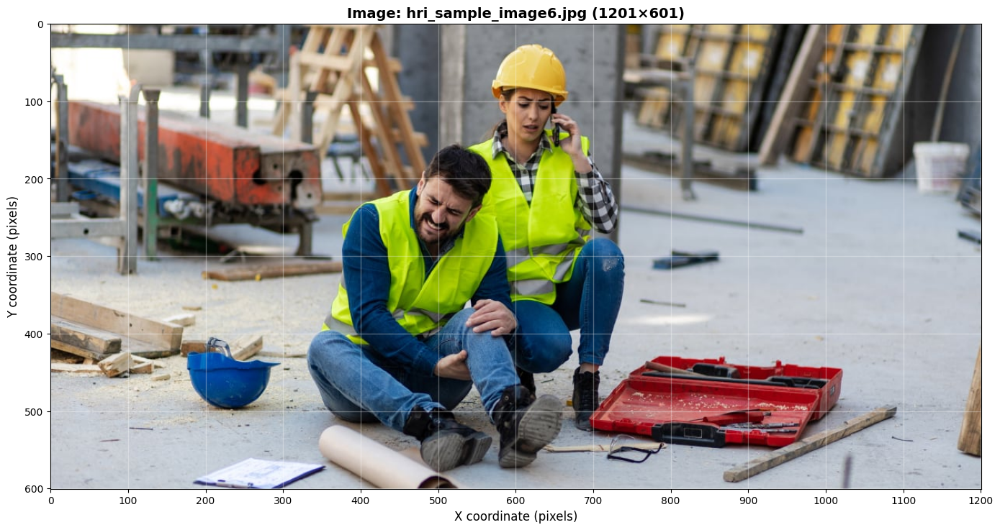

🔍 Validating face candidate at (427,46) size 55×55
   ✅ Passed validation: contrast=19.1, intensity=82.2, ratio=1.00
🔍 Validating face candidate at (584,78) size 75×75
   ✅ Passed validation: contrast=48.3, intensity=79.9, ratio=1.00

🤖 Showing automatically detected faces as suggestions...


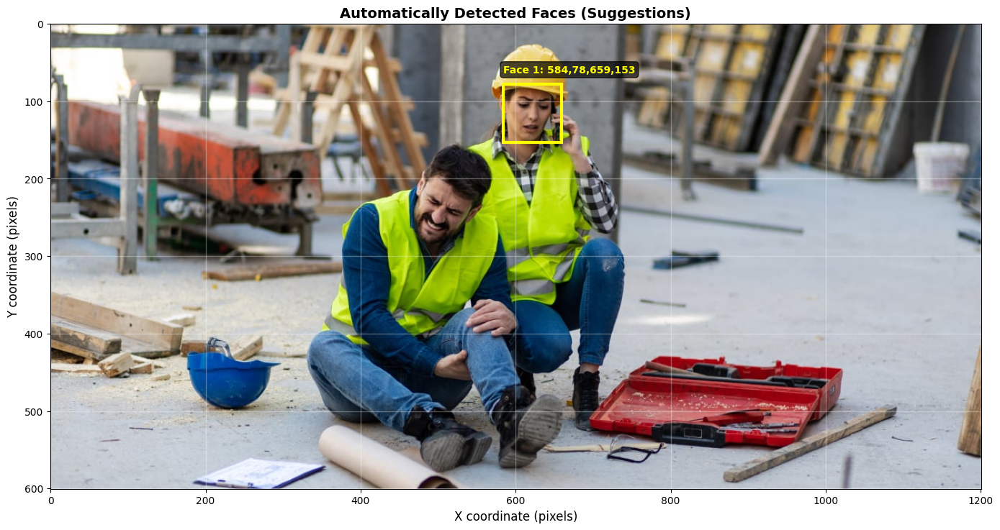


💡 SUGGESTED COORDINATES:
Copy these if they look good, or modify as needed:
  Face 1: 584,78,659,153

📍 Enter coordinates (x1,y1,x2,y2) or command: 584,78,659,153
✅ Region 1 added: (584,78) to (659,153)
   Size: 75×75 pixels


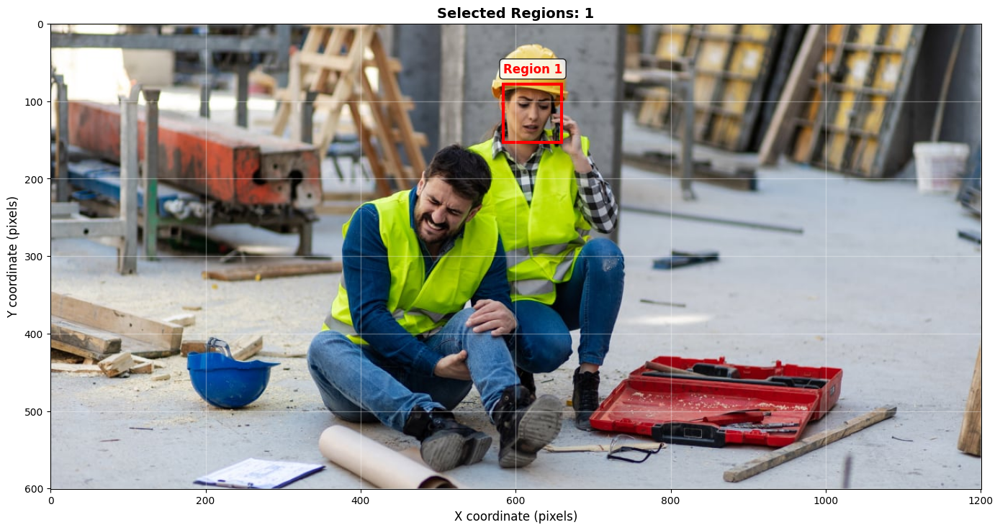


📍 Enter coordinates (x1,y1,x2,y2) or command: 450, 180, 550, 280
✅ Region 2 added: (450,180) to (550,280)
   Size: 100×100 pixels


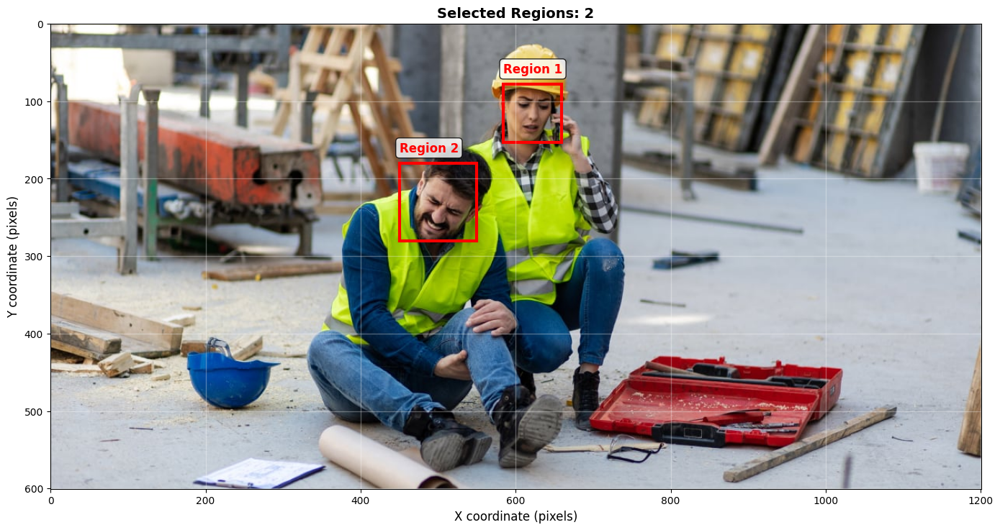


📍 Enter coordinates (x1,y1,x2,y2) or command: done

✅ Selection complete! 2 regions selected

✅ Using 2 manual selections
🔍 Running complete face detection and emotion analysis...
🎯 Using 2 custom face regions
👥 Successfully analyzed 2 faces
🔄 Calculating group emotion...
🤖 Running VLM analysis...
🎯 Running emotion-guided VLM analysis...

🎭 EMOTION ANALYSIS RESULTS

👤 INDIVIDUAL EMOTIONS (2 people):
----------------------------------------
  Person 1: SAD (95.9%)
             Location: (584,78) size 75×75
  Person 2: SAD (100.0%)
             Location: (450,180) size 100×100

🎭 GROUP EMOTION:
----------------------------------------
  Overall: SAD
  Confidence: 1.0%
  Method: weighted_average

🤖 SCENE ANALYSIS:
----------------------------------------
  a photo of a construction worker on the phone

🎯 EMOTION-GUIDED ANALYSIS:
----------------------------------------
  Context: SAD
  Analysis: a workplace scene focusing on areas needing improvement with a construction worker

📊 GENERAT

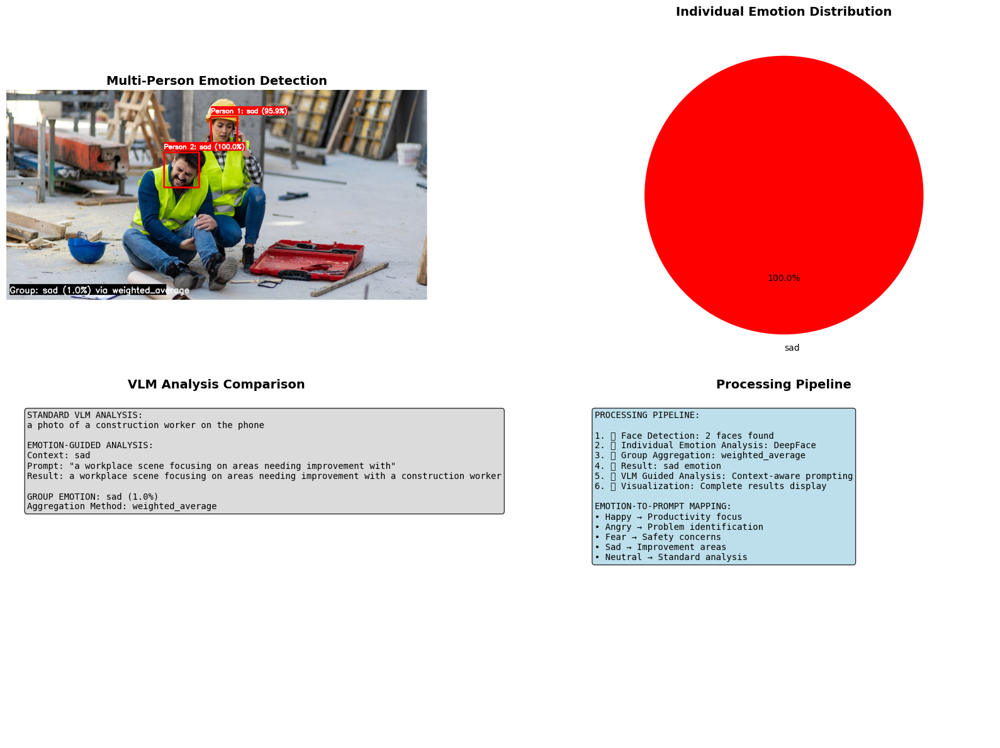

   ✅ Visual display generated successfully



In [38]:
interactive_emotion_analysis()

🎭 Interactive Emotion Analysis
📁 Enter image path: /content/hri_sample_image8.jpg

📊 Image: hri_sample_image8.jpg

🎯 Face Detection Method:
1. Automatic detection
2. Manual coordinate selection
3. Show automatic suggestions then manual selection
Choose method (1, 2, or 3): 3

🖱️  Starting guided coordinate selection...
🎯 MANUAL FACE REGION SELECTION
📋 Instructions:
   • Enter coordinates in format: x1,y1,x2,y2
   • x1,y1 = top-left corner
   • x2,y2 = bottom-right corner
   • Type 'done' when finished
   • Type 'show' to see current selections
   • Type 'clear' to start over
   • Type 'undo' to remove last selection



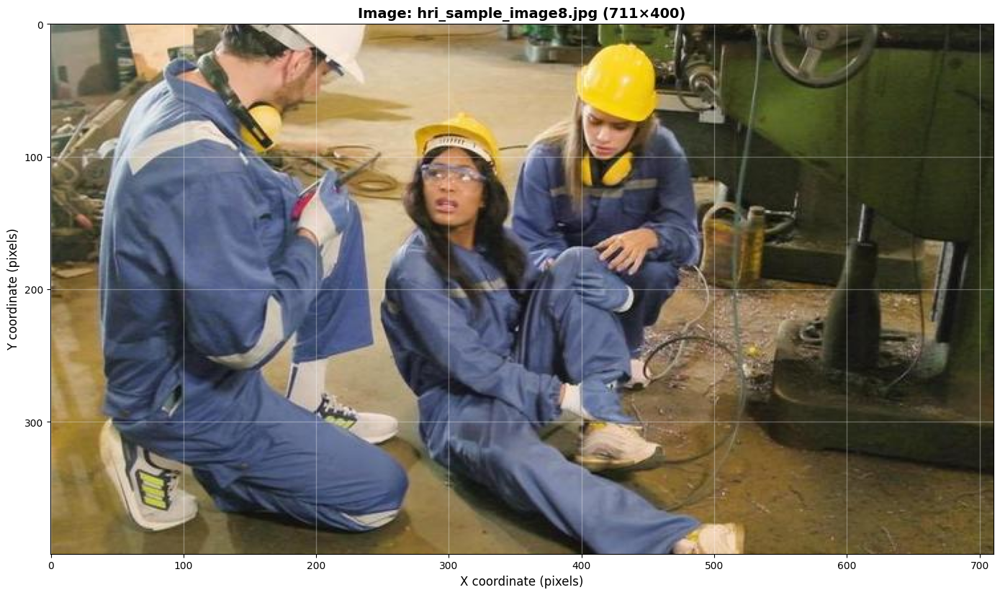

🔍 Validating face candidate at (273,93) size 55×55
   ✅ Passed validation: contrast=73.5, intensity=153.9, ratio=1.00

🤖 Showing automatically detected faces as suggestions...


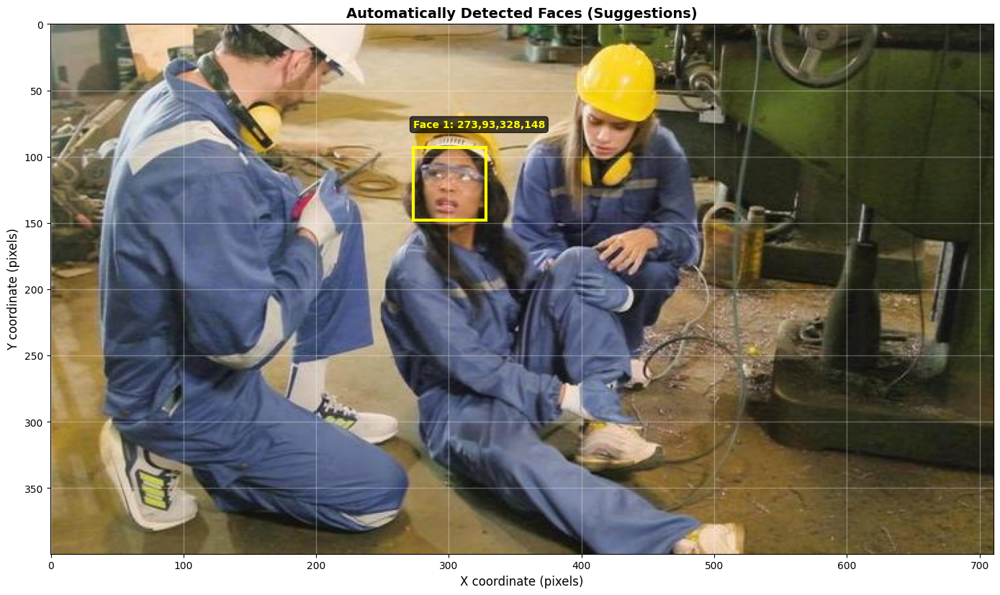


💡 SUGGESTED COORDINATES:
Copy these if they look good, or modify as needed:
  Face 1: 273,93,328,148

📍 Enter coordinates (x1,y1,x2,y2) or command: 273,93,335,155
✅ Region 1 added: (273,93) to (335,155)
   Size: 62×62 pixels


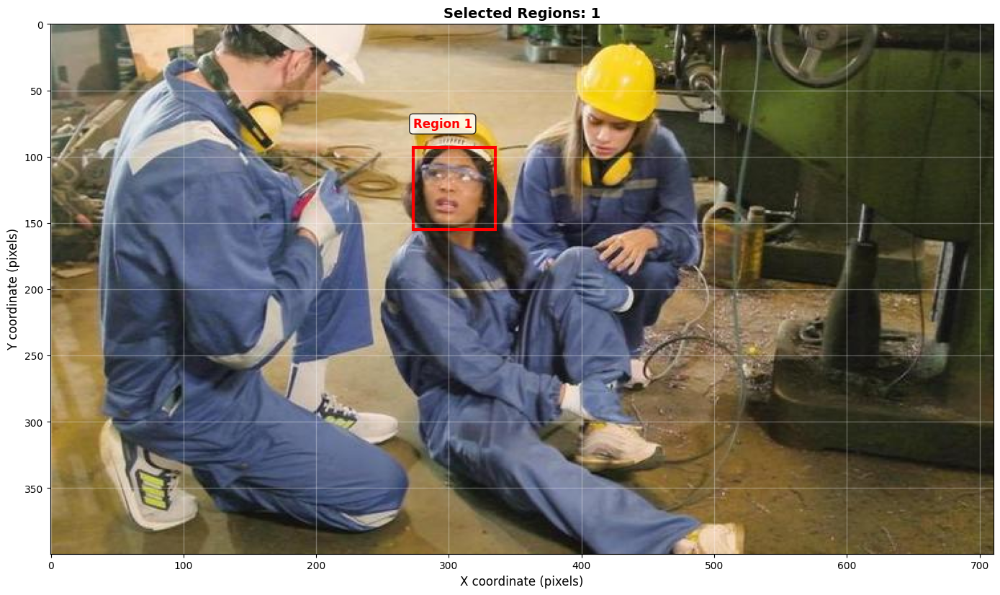


📍 Enter coordinates (x1,y1,x2,y2) or command: done

✅ Selection complete! 1 regions selected

✅ Using 1 manual selections
🔍 Running complete face detection and emotion analysis...
🎯 Using 1 custom face regions
👥 Successfully analyzed 1 faces
🔄 Calculating group emotion...
🤖 Running VLM analysis...
🎯 Running emotion-guided VLM analysis...

🎭 EMOTION ANALYSIS RESULTS

👤 INDIVIDUAL EMOTIONS (1 people):
----------------------------------------
  Person 1: SURPRISE (64.8%)
             Location: (273,93) size 62×62

🎭 GROUP EMOTION:
----------------------------------------
  Overall: SURPRISE
  Confidence: 1.0%
  Method: weighted_average

🤖 SCENE ANALYSIS:
----------------------------------------
  a photo of two engineers working on a machine

🎯 EMOTION-GUIDED ANALYSIS:
----------------------------------------
  Context: SURPRISE
  Analysis: an unexpected workplace situation with a team of engineers

📊 GENERATING VISUAL DISPLAY...
   Processing image data...
   📁 Loading image from file: 

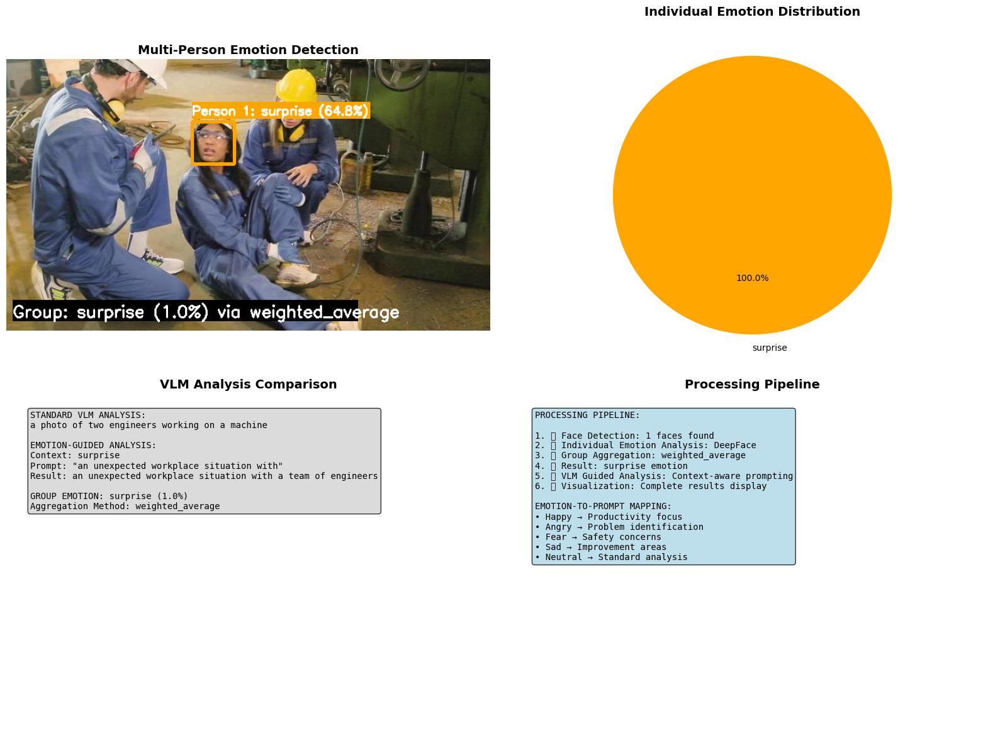

   ✅ Visual display generated successfully



In [15]:
interactive_emotion_analysis()

In [10]:
start_webcam_demo()